# Classification of Microorganisms of Sukhna and Dhanas Lakes Using an XGBoost Classifier Model

# Table of Contents:
- Importing the required libraries
- Importing dataset and checking the data
- Feature Selection
- Exploratory Data Analysis (EDA)
- Creating the train and test data set
- Building Decision Tree Classifier, Random Forest Classifier, KNN and XGBoost Classifier models
- Evaluating the 4 ML models
- Conclusion

# 1. Importing the required libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix 

import tensorflow as tf
from tensorflow.keras.models import Sequential

# 2. Importing dataset and checking the data

In [3]:
microorganisms_df = pd.read_csv("https://raw.githubusercontent.com/dphi-official/Datasets/master/sukhna_dhanas/train_set_label.csv" )

In [4]:
microorganisms_df.head()

,Solidity,Eccentricity,EquivDiameter,Extrema,FilledArea,Extent,Orientation,EulerNumber,BoundingBox1,BoundingBox2,...,ConvexHull3,ConvexHull4,MajorAxisLength,MinorAxisLength,Perimeter,ConvexArea,Centroid1,Centroid2,Area,microorganism
0,0.711636,0.673498,0.109069,0.870544,0.010808,0.660599,0.094353,0.987915,0.870476,0.447276,...,0.877460,0.871746,0.025669,0.028256,0.010776,0.001776,0.878873,0.453973,0.020195,1
1,0.184271,0.865533,0.181675,0.306442,0.021235,0.183804,0.484926,0.974488,0.284444,0.345343,...,0.295238,0.290794,0.128062,0.077815,0.044747,0.016309,0.325508,0.360384,0.045702,2
2,0.431175,0.679469,0.172644,0.750469,0.020929,0.380940,0.891717,0.946626,0.707302,0.227592,...,0.729524,0.723810,0.065495,0.062696,0.049242,0.006400,0.739531,0.255860,0.042004,2
3,0.712849,0.991839,0.240241,0.271420,0.036976,0.700643,0.016835,0.975159,0.268571,0.468366,...,0.269841,0.268571,0.146561,0.020286,0.035455,0.006678,0.267614,0.568813,0.073303,4
4,0.338077,0.996782,0.123578,0.045654,0.011389,0.088682,0.219150,0.982544,0.041905,0.630931,...,0.041905,0.041905,0.134704,0.011038,0.034491,0.004833,0.071762,0.699979,0.024521,2


In [5]:
microorganisms_df.tail()

,Solidity,Eccentricity,EquivDiameter,Extrema,FilledArea,Extent,Orientation,EulerNumber,BoundingBox1,BoundingBox2,...,ConvexHull3,ConvexHull4,MajorAxisLength,MinorAxisLength,Perimeter,ConvexArea,Centroid1,Centroid2,Area,microorganism
13819,0.168408,0.981720,0.219246,0.949969,0.031751,0.050051,0.689358,0.931521,0.673651,0.549209,...,0.673651,0.685079,0.255642,0.056345,0.104026,0.024249,0.796577,0.725174,0.062688,3
13820,0.541749,0.916983,0.127094,0.348968,0.017270,0.339002,0.698898,0.978852,0.290159,0.651142,...,0.293333,0.290159,0.050945,0.024784,0.019380,0.003070,0.306036,0.668967,0.025627,2
13821,0.451720,0.942211,0.091780,0.266482,0.007444,0.263728,0.767577,0.993522,0.232327,0.425128,...,0.232327,0.232387,0.047427,0.018674,0.020414,0.002278,0.245519,0.429552,0.015595,3
13822,0.635602,0.921632,0.140325,0.527830,0.015510,0.483057,0.578076,0.991944,0.457778,0.715290,...,0.457778,0.457778,0.049367,0.023263,0.019234,0.003033,0.496439,0.702198,0.029993,4
13823,0.356274,0.672519,0.017327,0.424640,0.000852,0.316551,0.068261,0.995972,0.417143,0.534271,...,0.417143,0.417143,0.009734,0.014289,0.006186,0.000409,0.410035,0.520666,0.001754,1


In [6]:
microorganisms_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13824 entries, 0 to 13823
Data columns (total 24 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Solidity         13824 non-null  float64
 1   Eccentricity     13824 non-null  float64
 2   EquivDiameter    13824 non-null  float64
 3   Extrema          13824 non-null  float64
 4   FilledArea       13824 non-null  float64
 5   Extent           13824 non-null  float64
 6   Orientation      13824 non-null  float64
 7   EulerNumber      13824 non-null  float64
 8   BoundingBox1     13824 non-null  float64
 9   BoundingBox2     13824 non-null  float64
 10  BoundingBox3     13824 non-null  float64
 11  BoundingBox4     13824 non-null  float64
 12  ConvexHull1      13824 non-null  float64
 13  ConvexHull2      13824 non-null  float64
 14  ConvexHull3      13824 non-null  float64
 15  ConvexHull4      13824 non-null  float64
 16  MajorAxisLength  13824 non-null  float64
 17  MinorAxisLen

In [7]:
microorganisms_df.shape

(13824, 24)

In [8]:
microorganisms_df.isnull().sum()

Solidity           0
Eccentricity       0
EquivDiameter      0
Extrema            0
FilledArea         0
Extent             0
Orientation        0
EulerNumber        0
BoundingBox1       0
BoundingBox2       0
BoundingBox3       0
BoundingBox4       0
ConvexHull1        0
ConvexHull2        0
ConvexHull3        0
ConvexHull4        0
MajorAxisLength    0
MinorAxisLength    0
Perimeter          0
ConvexArea         0
Centroid1          0
Centroid2          0
Area               0
microorganism      0
dtype: int64

In [9]:
microorganisms_df['microorganism'].value_counts()

4    3456
3    3456
2    3456
1    3456
Name: microorganism, dtype: int64

# 3. Feature Selection

Text(0.5, 1.0, 'Pairplot of independant variables')

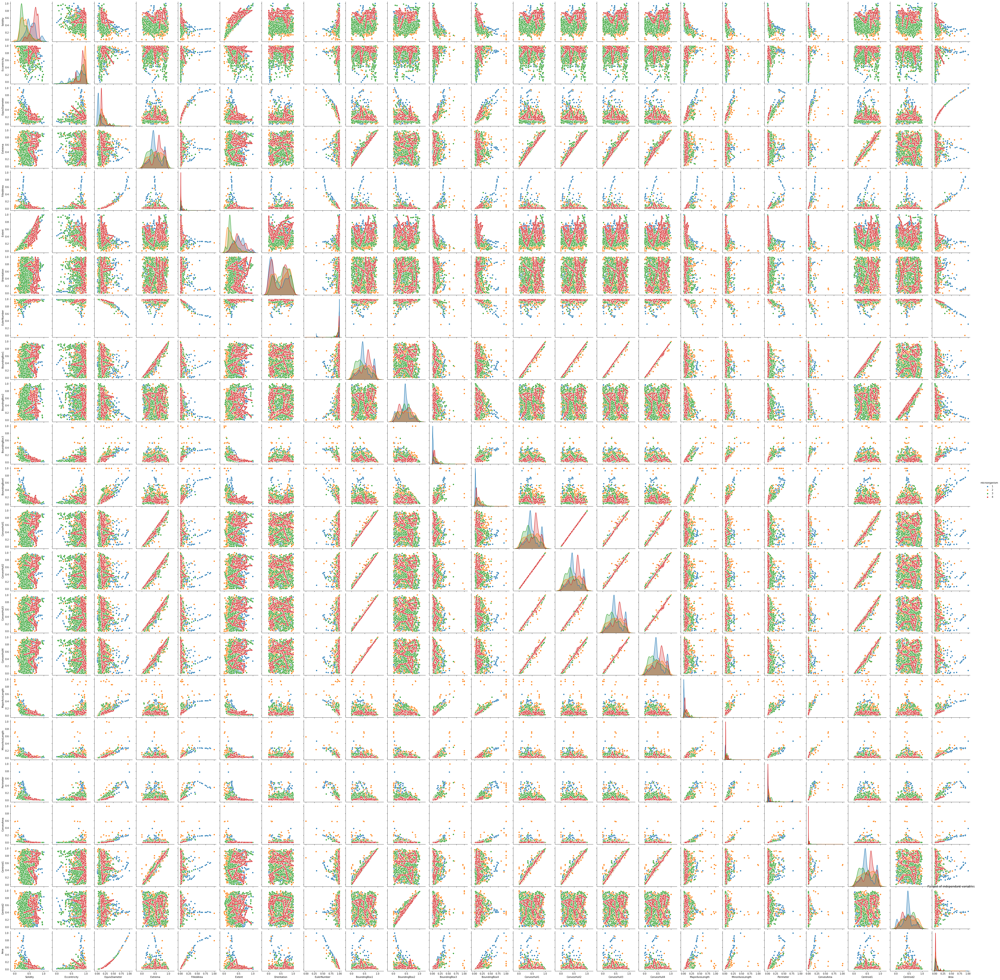

In [11]:
sns.pairplot(microorganisms_df, hue= 'microorganism')
plt.title("Pairplot of independant variables")

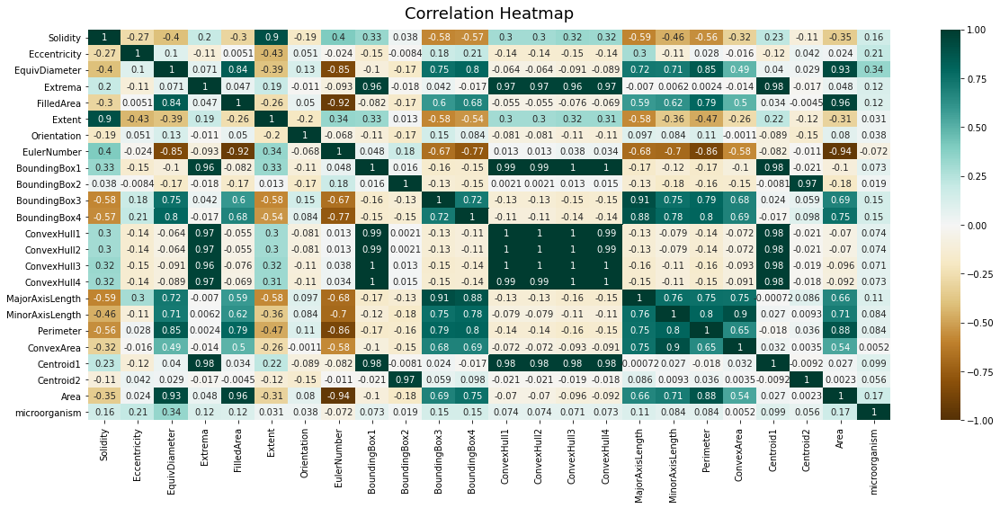

In [12]:
plt.figure(figsize=(20, 8))
heatmap = sns.heatmap(microorganisms_df.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

In [10]:
microorganisms_df.shape

(13824, 24)

In [11]:
#Selecting the best 15 columns out of 24
X = microorganisms_df.drop('microorganism', axis=1)
y = microorganisms_df['microorganism']

In [12]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

bestfeatures = SelectKBest(score_func=chi2, k=15)
fittedColumns = bestfeatures.fit(X,y)

In [13]:
dfscores = pd.DataFrame(fittedColumns.scores_)
dfcolumns = pd.DataFrame(X.columns)

In [14]:
featureScores = pd.concat([dfcolumns, dfscores],axis=1)
featureScores.columns = ['Independant Variables','Score']

In [15]:
print(featureScores)

   Independant Variables       Score
0               Solidity  584.616793
1           Eccentricity   58.161546
2          EquivDiameter  218.749071
3                Extrema   52.465571
4             FilledArea   50.845636
5                 Extent  610.579733
6            Orientation  113.837695
7            EulerNumber    2.743068
8           BoundingBox1   96.487728
9           BoundingBox2    4.935828
10          BoundingBox3  240.365274
11          BoundingBox4  255.633627
12           ConvexHull1   87.925723
13           ConvexHull2   87.925723
14           ConvexHull3   91.449974
15           ConvexHull4   90.816491
16       MajorAxisLength  253.032028
17       MinorAxisLength   84.876324
18             Perimeter  249.042849
19            ConvexArea   68.132843
20             Centroid1   65.583489
21             Centroid2   36.075176
22                  Area   85.044374


In [21]:
print(featureScores.nlargest(15,'Score'))

   Independant Variables       Score
5                 Extent  610.579733
0               Solidity  584.616793
11          BoundingBox4  255.633627
16       MajorAxisLength  253.032028
18             Perimeter  249.042849
10          BoundingBox3  240.365274
2          EquivDiameter  218.749071
6            Orientation  113.837695
8           BoundingBox1   96.487728
14           ConvexHull3   91.449974
15           ConvexHull4   90.816491
12           ConvexHull1   87.925723
13           ConvexHull2   87.925723
22                  Area   85.044374
17       MinorAxisLength   84.876324


In [22]:
bestVariables = ['Extent', 'Solidity', 'BoundingBox4', 'MajorAxisLength', 'Perimeter', 'BoundingBox3', 'EquivDiameter', 
'Orientation', 'BoundingBox1', 'ConvexHull3', 'ConvexHull4', 'ConvexHull1', 'ConvexHull2', 'Area', 'MinorAxisLength']

In [23]:
X = microorganisms_df[bestVariables]
y = microorganisms_df['microorganism']

In [25]:
X.head()

,Extent,Solidity,BoundingBox4,MajorAxisLength,Perimeter,BoundingBox3,EquivDiameter,Orientation,BoundingBox1,ConvexHull3,ConvexHull4,ConvexHull1,ConvexHull2,Area,MinorAxisLength
0,0.660599,0.711636,0.058923,0.025669,0.010776,0.029022,0.109069,0.094353,0.870476,0.877460,0.871746,0.875395,0.875395,0.020195,0.028256
1,0.183804,0.184271,0.115320,0.128062,0.044747,0.148896,0.181675,0.484926,0.284444,0.295238,0.290794,0.304870,0.304870,0.045702,0.077815
2,0.380940,0.431175,0.109428,0.065495,0.049242,0.066246,0.172644,0.891717,0.707302,0.729524,0.723810,0.728653,0.728653,0.042004,0.062696
3,0.700643,0.712849,0.249158,0.146561,0.035455,0.023344,0.240241,0.016835,0.268571,0.269841,0.268571,0.270715,0.270715,0.073303,0.020286
4,0.088682,0.338077,0.187710,0.134704,0.034491,0.100946,0.123578,0.219150,0.041905,0.041905,0.041905,0.041746,0.041746,0.024521,0.011038


In [27]:
print("Shape of the selected best independant variables: ", X.shape)

Shape of the selected best independant variables:  (13824, 15)


# 4. Exploratory Data Analysis (EDA)

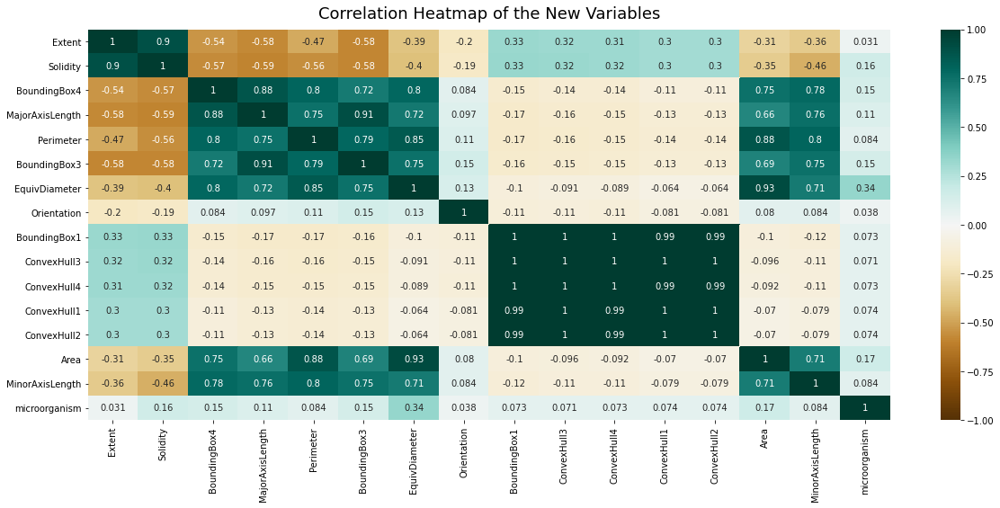

In [29]:
bestVariables = ['Extent', 'Solidity', 'BoundingBox4', 'MajorAxisLength', 'Perimeter', 'BoundingBox3', 'EquivDiameter', 
'Orientation', 'BoundingBox1', 'ConvexHull3', 'ConvexHull4', 'ConvexHull1', 'ConvexHull2', 'Area', 
'MinorAxisLength', 'microorganism']

plt.figure(figsize=(20, 8))
heatmap = sns.heatmap(microorganisms_df[bestVariables].corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap of the New Variables', fontdict={'fontsize':18}, pad=12);

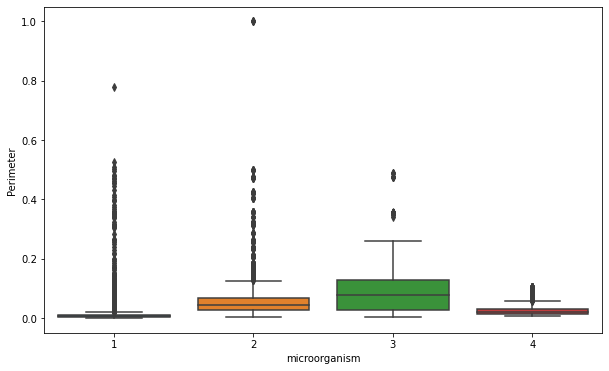

In [34]:
plt.figure(figsize=(10,6))
sns.boxplot(x='microorganism', y='Perimeter', data=microorganisms_df)

Text(0.5, 1.0, 'Minor Axis Length of the Microorganisms')

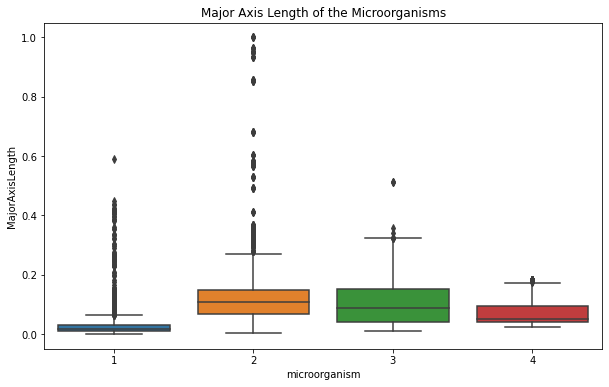

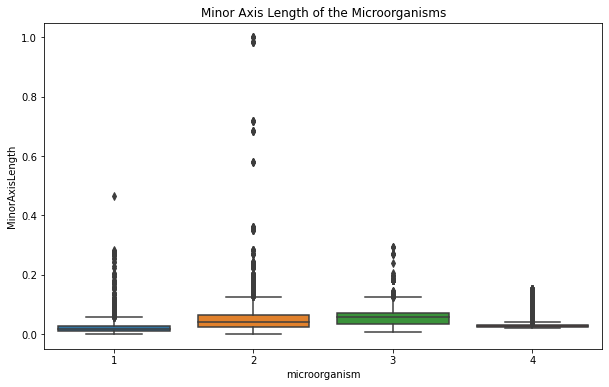

In [37]:
plt.figure(figsize=(10,6))
sns.boxplot(x='microorganism', y='MajorAxisLength', data=microorganisms_df)
plt.title("Major Axis Length of the Microorganisms")

plt.figure(figsize=(10,6))
sns.boxplot(x='microorganism', y='MinorAxisLength', data=microorganisms_df)
plt.title("Minor Axis Length of the Microorganisms")

Text(0.5, 1.0, 'Perimeters of the 4 different Microorganism')

<Figure size 720x432 with 0 Axes>

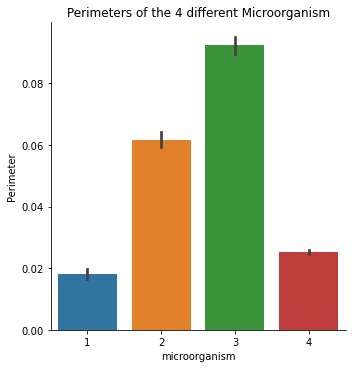

In [59]:
plt.figure(figsize=(10,6))
sns.catplot(x='microorganism', y='Perimeter', data=microorganisms_df, kind='bar')
plt.title("Perimeters of the 4 different Microorganism")

Text(0.5, 1.0, 'Solidity of the 4 different Microorganism')

<Figure size 720x432 with 0 Axes>

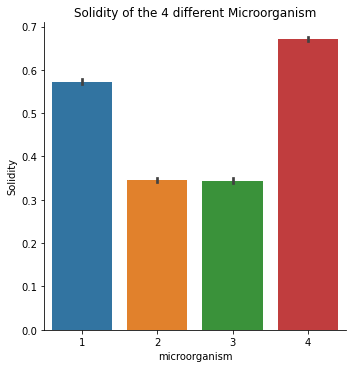

In [60]:
plt.figure(figsize=(10,6))
sns.catplot(x='microorganism', y='Solidity', data=microorganisms_df, kind='bar')
plt.title("Solidity of the 4 different Microorganism")

Text(0.5, 1.0, 'Extents of the 4 different Microorganism')

<Figure size 720x432 with 0 Axes>

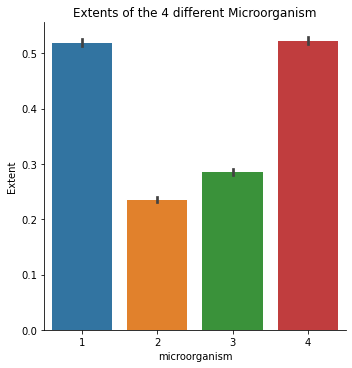

In [61]:
plt.figure(figsize=(10,6))
sns.catplot(x='microorganism', y='Extent', data=microorganisms_df, kind='bar')
plt.title("Extents of the 4 different Microorganism")

Text(0.5, 1.0, 'Area of the 4 different Microorganism')

<Figure size 720x432 with 0 Axes>

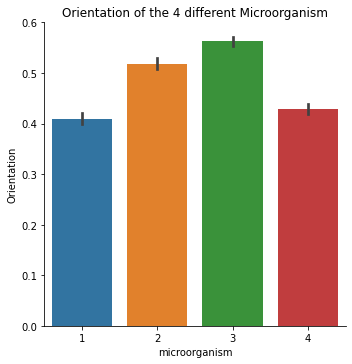

<Figure size 720x432 with 0 Axes>

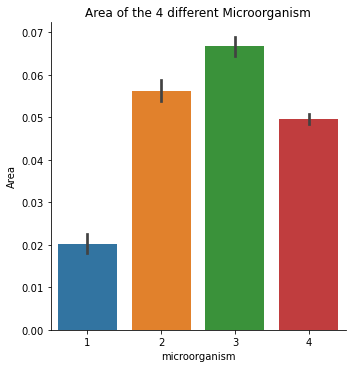

In [63]:
plt.figure(figsize=(10,6))
sns.catplot(x='microorganism', y='Orientation', data=microorganisms_df, kind='bar')
plt.title("Orientation of the 4 different Microorganism")

plt.figure(figsize=(10,6))
sns.catplot(x='microorganism', y='Area', data=microorganisms_df, kind='bar')
plt.title("Area of the 4 different Microorganism")

# 4. Creating the train and test data set

In [26]:
independantVariables = ['Extent', 'Solidity', 'BoundingBox4', 'MajorAxisLength', 'Perimeter', 'BoundingBox3', 'EquivDiameter', 
'Orientation', 'BoundingBox1', 'ConvexHull3', 'ConvexHull4', 'ConvexHull1', 'ConvexHull2', 'Area', 
'MinorAxisLength']

In [27]:
X = microorganisms_df[independantVariables]
y = microorganisms_df['microorganism']

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [29]:
X_train.shape, X_test.shape

((9676, 15), (4148, 15))

# 5. Building Decision Tree Classifier, Random Forest Classifier, KNN and XGBoost Classifier models

### 5.1 Decision Tree Classifier

In [68]:
from sklearn.tree import DecisionTreeClassifier

In [69]:
dtc = DecisionTreeClassifier()

In [71]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [72]:
preds_dtc = dtc.predict(X_test)

In [74]:
print("The accuracy of the Decision Tree Classifier model:", accuracy_score(y_test, preds_dtc))

The accuracy of the Decision Tree Classifier model: 0.9710703953712633


### 5.2 Random Forest Classifier

In [75]:
from sklearn.ensemble import RandomForestClassifier

In [76]:
rfc = RandomForestClassifier(n_estimators=1000)

In [77]:
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [78]:
preds_rfc = rfc.predict(X_test)

In [79]:
print("The accuracy of the Random Forest Classifier model:", accuracy_score(y_test, preds_rfc))

The accuracy of the Random Forest Classifier model: 0.9864995178399228


### 5.3 K-Nearest Neighbours Classifier

In [81]:
from sklearn.neighbors import KNeighborsClassifier

In [84]:
error_rate = []

for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

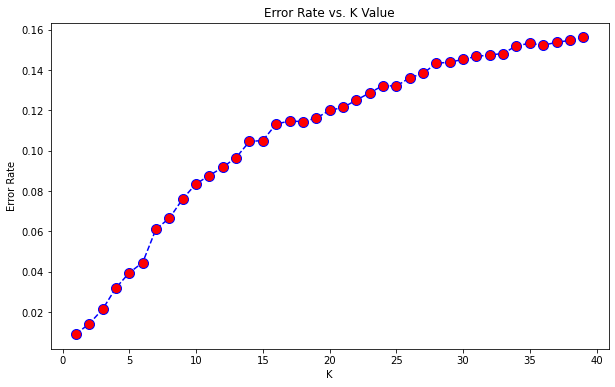

In [85]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [86]:
knn = KNeighborsClassifier(n_neighbors=5)

In [87]:
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [88]:
preds_knn = knn.predict(X_test)

In [89]:
print("The accuracy of the KNN Classifier model:", accuracy_score(y_test, preds_knn))

The accuracy of the KNN Classifier model: 0.9604628736740598


### 5.4 XGBoost Classifier

In [91]:
import xgboost as xgb

In [92]:
xgb_model = xgb.XGBClassifier()

In [93]:
xgb_model.fit(X_train, y_train)

[22:43:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', use_label_encoder=True,
              validate_parameters=1, verbosity=None)

In [94]:
preds_XGB = xgb_model.predict(X_test)

In [95]:
print("The accuracy of the KNN Classifier model:", accuracy_score(y_test, preds_XGB))

The accuracy of the KNN Classifier model: 0.9857762777242044


# 6. Evaluating the ML Models 

### 6.1 Metrics of Decision Tree Classifier Model

In [102]:
print("Decision Tree Classifier Performance Metrics")
print("\n")
print(classification_report(y_test, preds_dtc))

Decision Tree Classifier Performance Metrics


              precision    recall  f1-score   support

           1       0.97      0.95      0.96      1030
           2       0.95      1.00      0.97      1028
           3       0.98      0.94      0.96      1054
           4       0.99      1.00      0.99      1036

    accuracy                           0.97      4148
   macro avg       0.97      0.97      0.97      4148
weighted avg       0.97      0.97      0.97      4148



Text(0.5, 1.0, 'Confusion Matrix for Decision Tree Classifier Model')

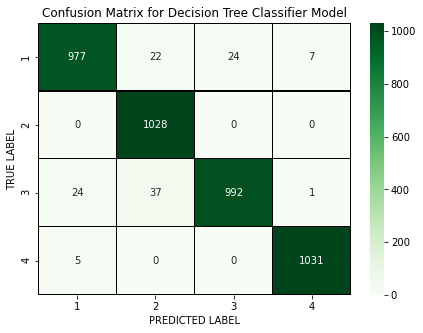

In [105]:
#Confusion Matrix of DTC model.
cm = confusion_matrix(y_test, preds_dtc)

x_axis_labels = ["1", "2", "3", "4"]
y_axis_labels = ["1", "2", "3", "4"]

f, ax = plt.subplots(figsize =(7,5))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Greens", 
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier Model')

### 6.2 Metrics of Random Forest Classifier Model

In [103]:
print("Random Forest Classifier Performance Metrics")
print("\n")
print(classification_report(y_test, preds_rfc))

Random Forest Classifier Performance Metrics


              precision    recall  f1-score   support

           1       0.99      0.97      0.98      1030
           2       0.98      1.00      0.99      1028
           3       0.98      0.98      0.98      1054
           4       1.00      1.00      1.00      1036

    accuracy                           0.99      4148
   macro avg       0.99      0.99      0.99      4148
weighted avg       0.99      0.99      0.99      4148



Text(0.5, 1.0, 'Confusion Matrix for Random Forest Classifier Model')

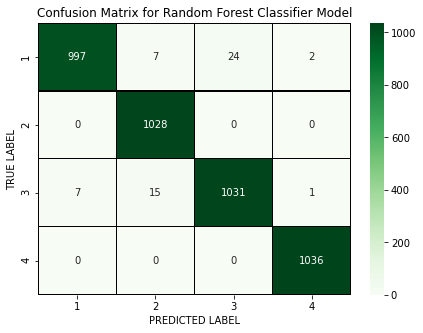

In [107]:
#Confusion Matrix of RFC model.
cm2 = confusion_matrix(y_test, preds_rfc)

x_axis_labels = ["1", "2", "3", "4"]
y_axis_labels = ["1", "2", "3", "4"]

f, ax = plt.subplots(figsize =(7,5))
sns.heatmap(cm2, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Greens", 
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Random Forest Classifier Model')

### 6.3 Metrics of K-Nearest Neighbours Classifier Model

In [108]:
print("KNN Classifier Performance Metrics")
print("\n")
print(classification_report(y_test, preds_knn))

KNN Classifier Performance Metrics


              precision    recall  f1-score   support

           1       0.97      0.95      0.96      1030
           2       0.93      0.97      0.95      1028
           3       0.95      0.93      0.94      1054
           4       0.99      1.00      0.99      1036

    accuracy                           0.96      4148
   macro avg       0.96      0.96      0.96      4148
weighted avg       0.96      0.96      0.96      4148



Text(0.5, 1.0, 'Confusion Matrix for KNN Classifier Model')

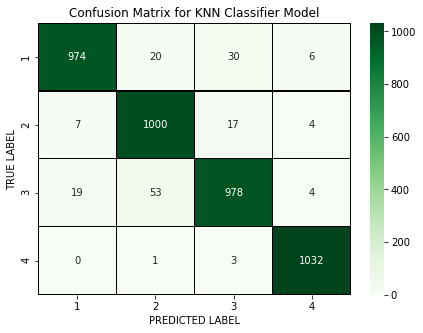

In [109]:
#Confusion Matrix of KNN model.
cm3 = confusion_matrix(y_test, preds_knn)

x_axis_labels = ["1", "2", "3", "4"]
y_axis_labels = ["1", "2", "3", "4"]

f, ax = plt.subplots(figsize =(7,5))
sns.heatmap(cm3, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Greens", 
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for KNN Classifier Model')

### 6.4 Metrics of XGBoost Classifier Model

In [110]:
print("XGBoost Classifier Performance Metrics")
print("\n")
print(classification_report(y_test, preds_XGB))

XGBoost Classifier Performance Metrics


              precision    recall  f1-score   support

           1       0.99      0.97      0.98      1030
           2       0.97      1.00      0.98      1028
           3       0.98      0.98      0.98      1054
           4       1.00      1.00      1.00      1036

    accuracy                           0.99      4148
   macro avg       0.99      0.99      0.99      4148
weighted avg       0.99      0.99      0.99      4148



Text(0.5, 1.0, 'Confusion Matrix for XGBoost Classifier Model')

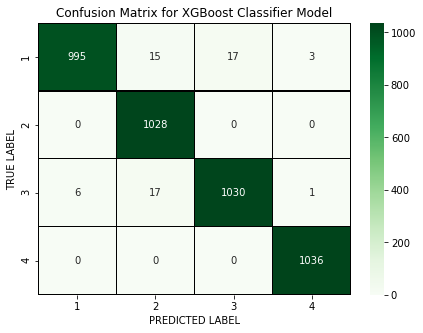

In [113]:
#Confusion Matrix of XGBoose model.
cm4 = confusion_matrix(y_test, preds_XGB)

x_axis_labels = ["1", "2", "3", "4"]
y_axis_labels = ["1", "2", "3", "4"]

f, ax = plt.subplots(figsize =(7,5))
sns.heatmap(cm4, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Greens", 
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGBoost Classifier Model')

# 7. Conclusion

## ~ XGBoost and Random Forest classification model performed really well in the data set.